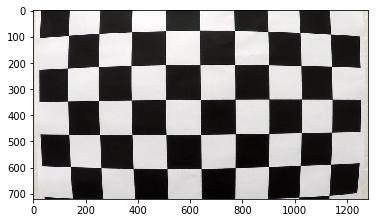

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

img = mpimg.imread('camera_cal/calibration1.jpg')
plt.imshow(img)

In [2]:
objpoints = []
imgpoints = []

objp = np.zeros((6*9, 3), np.float32)
objp[:,:2] = np.mgrid[0:9:, 0:6].T.reshape(-1,2)

images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        write_name = 'corners_found'+str(idx)+'.jpg'
        cv2.imwrite(write_name, img)

In [3]:
import pickle

# Test undistortion on an image
def undistort_one_img(input_dir, file_name, output_dir, show_res):
    name = file_name.split('.')[0]
    img = mpimg.imread(input_dir + '/' + file_name)
    img_size = (img.shape[1], img.shape[0])

    # Do camera calibration given
    # object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

    dst = cv2.undistort(img, mtx, dist, None, mtx)
    dstRGB = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    cv2.imwrite(output_dir + '/' + name + '_undistorted.jpg', dstRGB)

    # Save the camera calibration result
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump(dist_pickle, open(output_dir + '/' + name + '_undistorted_pickle.p', "wb"))

    # Visualize undistortion
    if show_res == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(dst)
        ax2.set_title('Undistorted Image', fontsize=30)

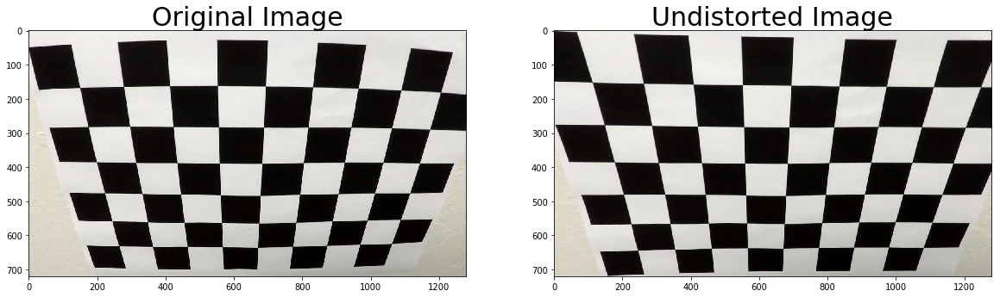

In [4]:
# Undistort an example chessboard image
undistort_one_img('camera_cal', 'calibration2.jpg', 'camera_cal', True)

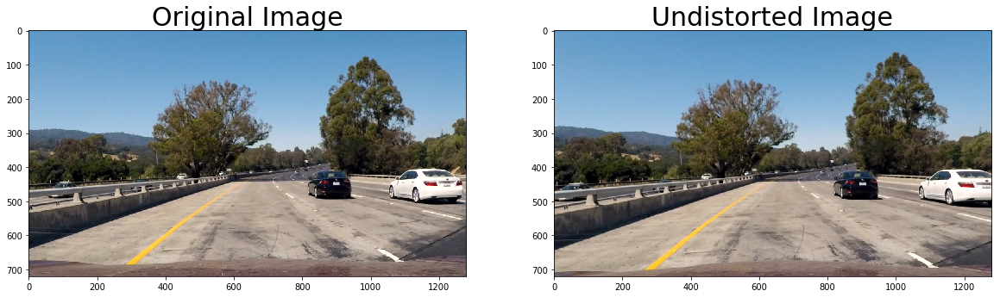

In [5]:
# Undistort all the input images
undistort_one_img('test_images', 'test1.jpg', 'output_images', True)
undistort_one_img('test_images', 'test2.jpg', 'output_images', False)
undistort_one_img('test_images', 'test3.jpg', 'output_images', False)
undistort_one_img('test_images', 'test4.jpg', 'output_images', False)
undistort_one_img('test_images', 'test5.jpg', 'output_images', False)
undistort_one_img('test_images', 'test6.jpg', 'output_images', False)

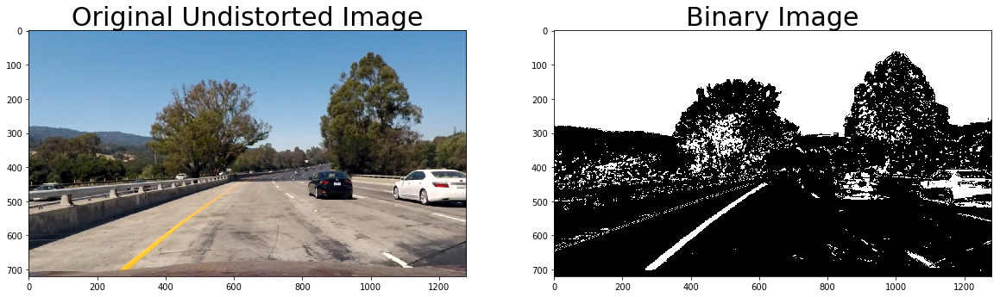

In [6]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh_min=0, thresh_max=255):   
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    if orient == 'y':    
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary = np.zeros_like(scaled_sobel)
            
    # 6) Return this mask as your binary_output image
    binary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return binary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def color_thresh(image):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    # Threshold color channel
    s_thresh_min = 100
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    return s_binary

def white_thresh(image):
    r_channel = image[:,:,2]
    g_channel = image[:,:,1]
    b_channel = image[:,:,0]
    thresh_min = 120
    res_binary = np.zeros_like(r_channel)
    res_binary[(r_channel >= thresh_min) & (g_channel >= thresh_min) & (b_channel >= thresh_min)] = 1
    return res_binary

def gray_thresh(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    g_binary = np.zeros_like(gray)
    g_binary[gray >= 100] = 1
    return g_binary

def get_binary_img(img):
    # Sobel 
    ksize = 11
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh_min=40, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh_min=40, thresh_max=100)
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(50, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7, 1.3))    
    sxbinary = np.zeros_like(dir_binary)
    sxbinary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    # Color
    s_binary = color_thresh(img)
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary
    
def get_binary(input_dir, file_name, output_dir, show_res):
    name = file_name.split('.')[0]
    img = mpimg.imread(input_dir + '/' + file_name)
    combined_binary = get_binary_img(img)
    cv2.imwrite(output_dir + '/' + name + '_binary.jpg', combined_binary)
    
    if show_res == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Undistorted Image', fontsize=30)
        ax2.imshow(combined_binary, cmap='gray')
        ax2.set_title('Binary Image', fontsize=30)

get_binary('output_images', 'test1_undistorted.jpg', 'output_images', True)
get_binary('output_images', 'test2_undistorted.jpg', 'output_images', False)
get_binary('output_images', 'test3_undistorted.jpg', 'output_images', False)
get_binary('output_images', 'test4_undistorted.jpg', 'output_images', False)
get_binary('output_images', 'test5_undistorted.jpg', 'output_images', False)
get_binary('output_images', 'test6_undistorted.jpg', 'output_images', False)

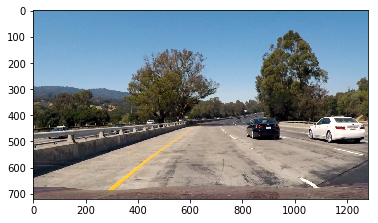

In [7]:
img = mpimg.imread('test_images/test1.jpg')
plt.imshow(img)

In [8]:
def get_transform_M(img):
    src = np.float32(
        [[434, 575],
         [910, 575],
         [348, 637],
         [1029, 637]])
    dst = np.float32(
        [[391, 555],
         [940, 555],
         [391, 647],
         [940, 647]])
    M = cv2.getPerspectiveTransform(src, dst)
    inv_M = cv2.getPerspectiveTransform(dst, src)
    return (M, inv_M)

def warp(img):
    img_size = (img.shape[1], img.shape[0])
    M, inv_M = get_transform_M(img)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped

def show_warped(name, show_res):
    img = mpimg.imread(name)
    warp_img = warp(img)
    if show_res == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Undistorted Image', fontsize=30)
        ax2.imshow(warp_img)
        ax2.set_title('Warped Image', fontsize=30)
    return warp_img
        
def generate_binary(img, show_res):
    ksize = 7
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh_min=50, thresh_max=100)
    #grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh_min=20, thresh_max=100)
    #mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(30, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7, 1.3))    
    sxbinary = np.zeros_like(gradx)
    sxbinary[(gradx == 1) & (dir_binary == 1)] = 1
    #sxbinary[((mag_binary == 1) & (dir_binary == 1))] = 1
    
    #sxbinary[gradx == 1] = 1
    while_binary = white_thresh(img)
    s_binary = color_thresh(img)
    g_binary = gray_thresh(img)
    
    combined_binary = np.zeros_like(sxbinary)
    #combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    combined_binary[(((s_binary == 1) | (sxbinary == 1)) & g_binary == 1) | ((while_binary == 1) & (gradx == 1))] = 1
    
    if show_res == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Warped Image', fontsize=30)
        ax2.imshow(combined_binary, cmap='gray')
        ax2.set_title('Binary Warped Image', fontsize=30)
    return combined_binary        

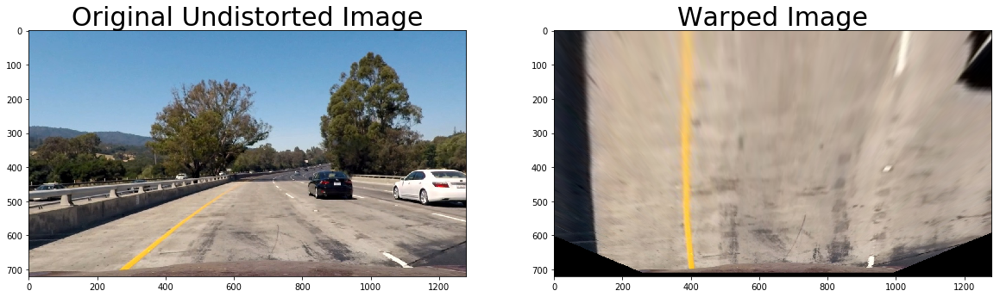

In [9]:
warp_imgs = []
warp_imgs.append(show_warped('output_images/test1_undistorted.jpg', True))

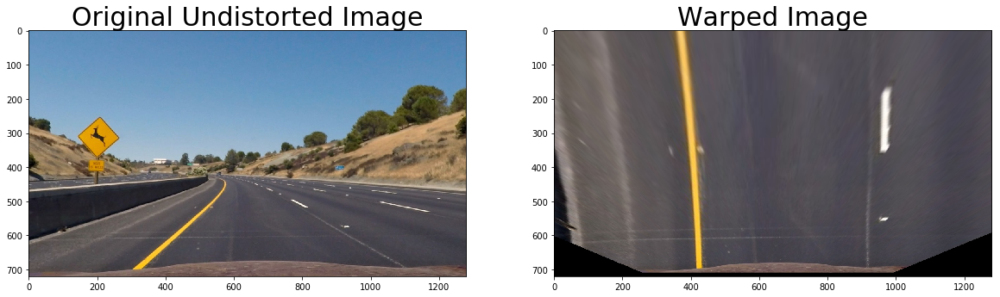

In [10]:
warp_imgs.append(show_warped('output_images/test2_undistorted.jpg', True))

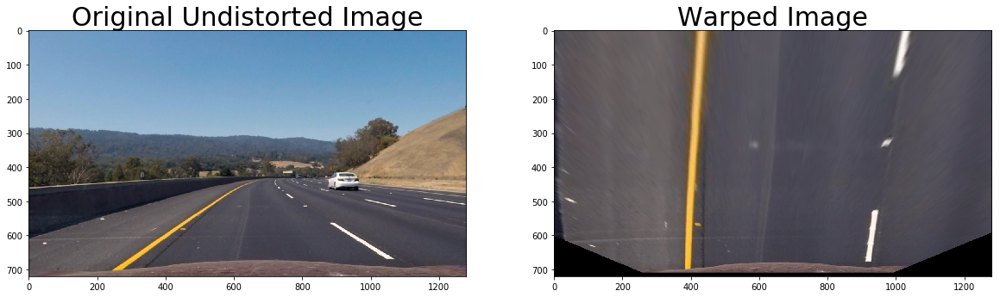

In [11]:
warp_imgs.append(show_warped('output_images/test3_undistorted.jpg', True))

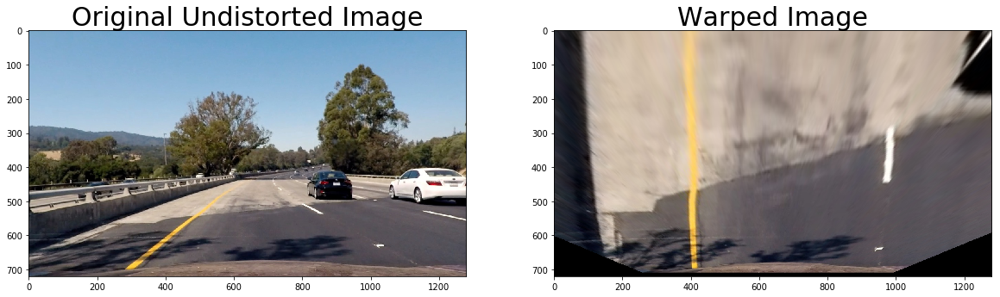

In [12]:
warp_imgs.append(show_warped('output_images/test4_undistorted.jpg', True))

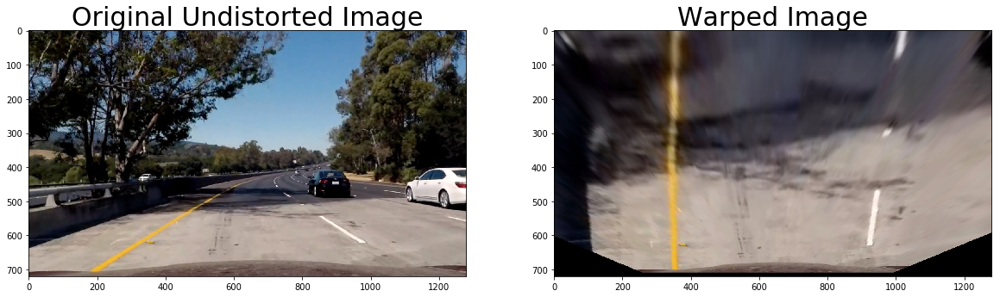

In [13]:
warp_imgs.append(show_warped('output_images/test5_undistorted.jpg', True))

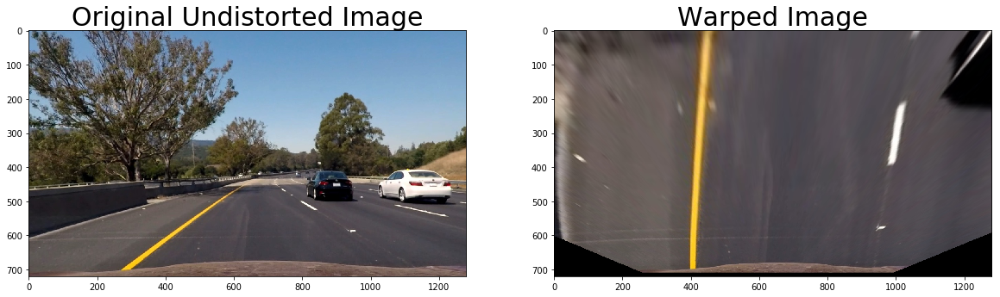

In [14]:
warp_imgs.append(show_warped('output_images/test6_undistorted.jpg', True))

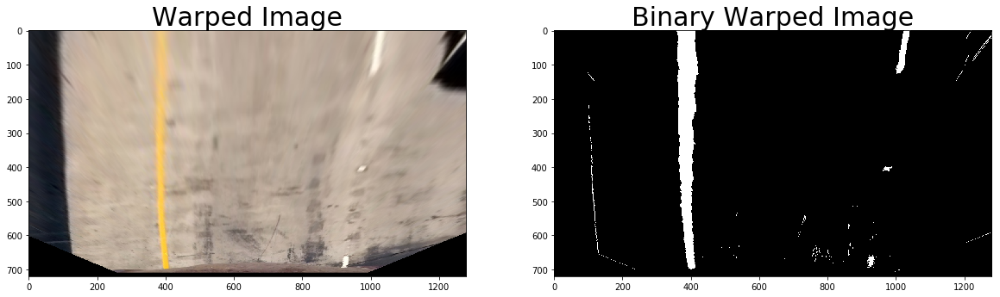

In [15]:
warp_binary_imgs = []
warp_binary_imgs.append(generate_binary(warp_imgs[0], True))

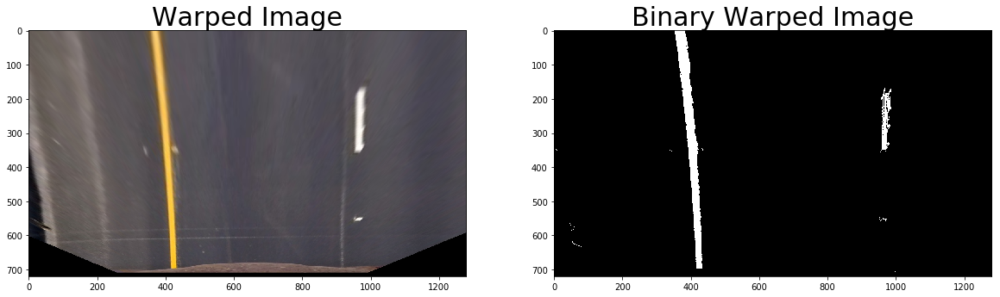

In [16]:
warp_binary_imgs.append(generate_binary(warp_imgs[1], True))

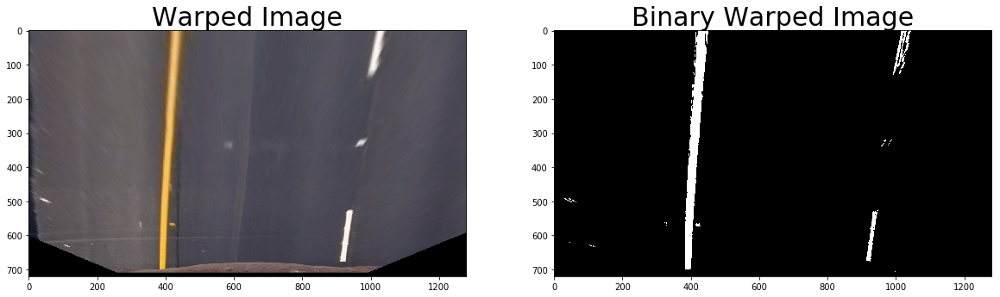

In [17]:
warp_binary_imgs.append(generate_binary(warp_imgs[2], True))

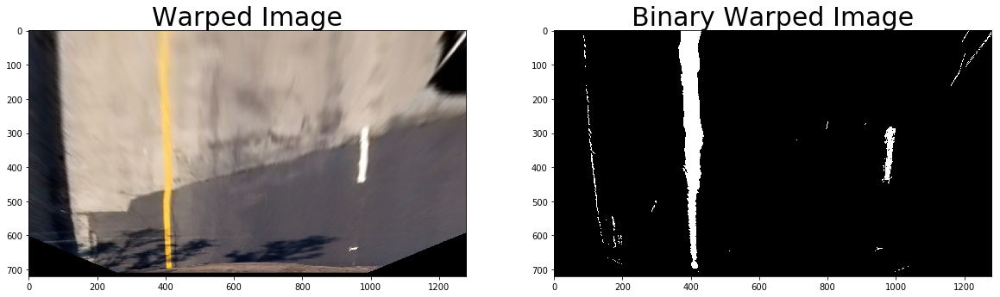

In [18]:
warp_binary_imgs.append(generate_binary(warp_imgs[3], True))

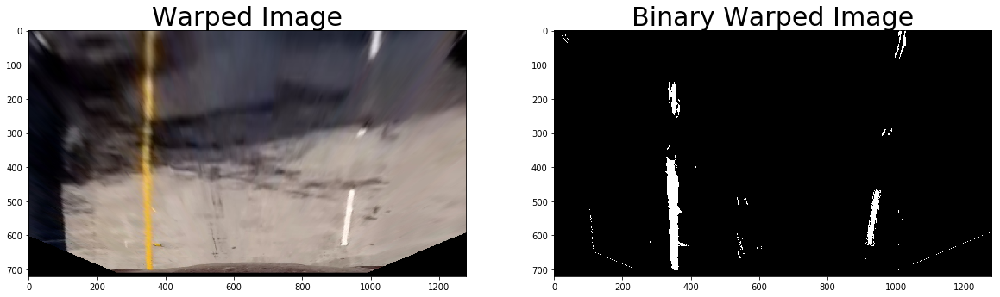

In [19]:
warp_binary_imgs.append(generate_binary(warp_imgs[4], True))

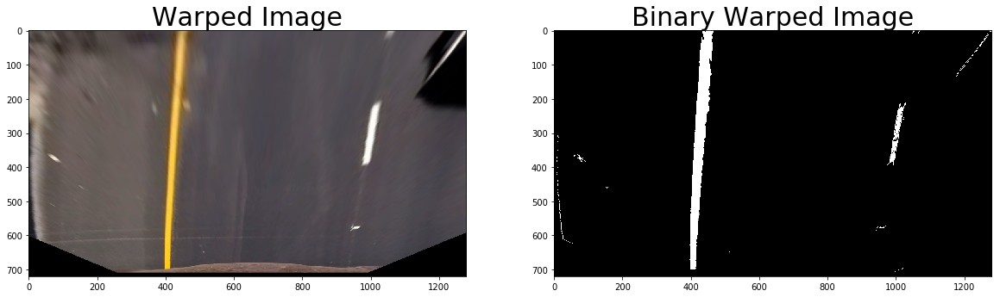

In [20]:
warp_binary_imgs.append(generate_binary(warp_imgs[5], True))

In [21]:
def get_curvature(ploty, leftx, rightx):
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    y_eval = np.max(ploty)
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)

    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    return (left_curverad, right_curverad)

def fit_lane_line(binary_warped, show_res):
    # Assuming you have created a warped binary image called "binary_warped"
    # Create an output image to draw on and  visualize the result
    x = binary_warped.shape[0]
    y = binary_warped.shape[1]
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[:,100:y-100], axis=0)

    out_img = np.empty((x,y,3))
    out_img[:,:,0] = binary_warped
    out_img[:,:,1] = binary_warped
    out_img[:,:,2] = binary_warped
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint]) + 100
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint + 100

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
     
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    #out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    #out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    x_curvature, y_curvature = get_curvature(ploty, left_fitx, right_fitx)
    if show_res:
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        print('curvature:', x_curvature, 'm', y_curvature, 'm')
    
    return (left_fit, right_fit, ploty, left_fitx, right_fitx, leftx_base, rightx_base)

In [22]:
def final_visualize(binary_warped, left_fit, right_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw on and an image to show the selection window
    x = binary_warped.shape[0]
    y = binary_warped.shape[1]
    out_img = np.empty((x,y,3))
    out_img[:,:,0] = binary_warped
    out_img[:,:,1] = binary_warped
    out_img[:,:,2] = binary_warped
    
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
def orig_img_lane_locate(warped, image, left_fitx, right_fitx, ploty, leftx_base, rightx_base):
    M, inv_M = get_transform_M(warped)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, inv_M, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    
    l_curv, r_curv = get_curvature(ploty, left_fitx, right_fitx)
    offset = 600 - (leftx_base + rightx_base) / 2
    xm_per_pix = 3.7/700
    pos = float("{0:.2f}".format(offset*xm_per_pix))
                         
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, str(int(l_curv)) + 'm', (200,100), font, 2,(255,255,255),2)
    cv2.putText(result, str(int(r_curv)) + 'm', (1000,100), font, 2,(255,255,255),2)
    cv2.putText(result, str(pos) + 'm', (500,100), font, 2,(255,255,255),2)
    plt.imshow(result)
    return result
    

curvature: 2519.5004961 m 1919.02429728 m


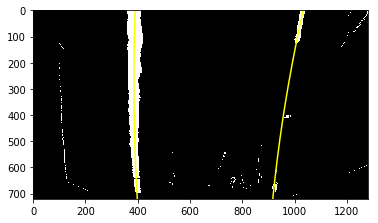

In [23]:
binary_warped = warp_binary_imgs[0]
left_fit, right_fit, ploty, left_fitx, right_fitx, leftx_base, rightx_base = fit_lane_line(binary_warped, True)

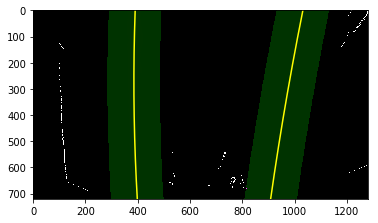

In [24]:
final_visualize(binary_warped, left_fit, right_fit)

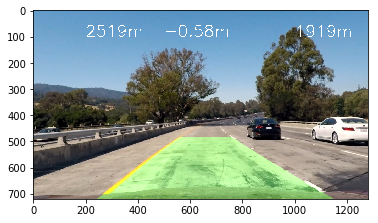

In [25]:
im = mpimg.imread('output_images/test1_undistorted.jpg')
res = orig_img_lane_locate(binary_warped, im, left_fitx, right_fitx, ploty, leftx_base, rightx_base)

curvature: 2568.49696802 m 1348.8199583 m


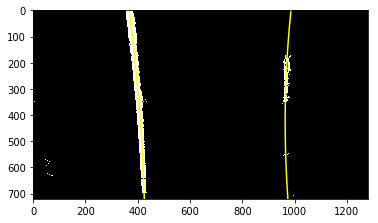

In [26]:
binary_warped = warp_binary_imgs[1]
left_fit, right_fit, ploty, left_fitx, right_fitx, leftx_base, rightx_base = fit_lane_line(binary_warped, True)

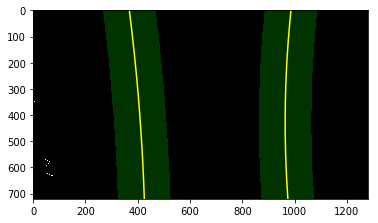

In [27]:
final_visualize(binary_warped, left_fit, right_fit)

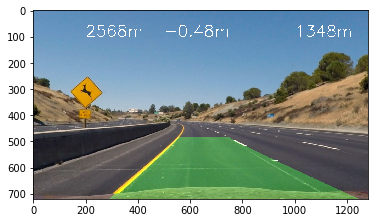

In [28]:
im = mpimg.imread('output_images/test2_undistorted.jpg')
res = orig_img_lane_locate(binary_warped, im, left_fitx, right_fitx, ploty, leftx_base, rightx_base)

curvature: 5101.0583034 m 2745.32857927 m


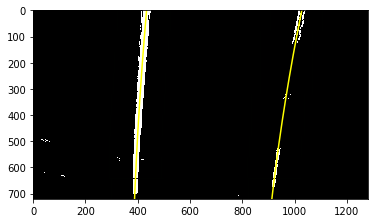

In [29]:
binary_warped = warp_binary_imgs[2]
res = left_fit, right_fit, ploty, left_fitx, right_fitx, leftx_base, rightx_base = fit_lane_line(binary_warped, True)

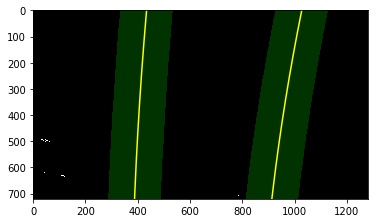

In [30]:
final_visualize(binary_warped, left_fit, right_fit)

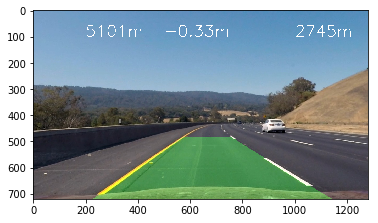

In [31]:
im = mpimg.imread('output_images/test3_undistorted.jpg')
res = orig_img_lane_locate(binary_warped, im, left_fitx, right_fitx, ploty, leftx_base, rightx_base)

curvature: 4300.15228716 m 826.061489499 m


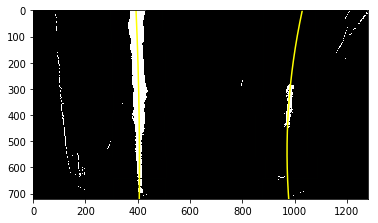

In [32]:
binary_warped = warp_binary_imgs[3]
left_fit, right_fit, ploty, left_fitx, right_fitx, leftx_base, rightx_base = fit_lane_line(binary_warped, True)

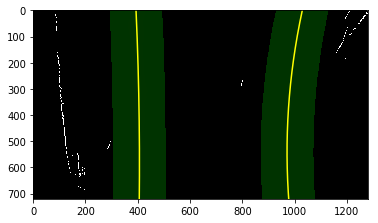

In [33]:
final_visualize(binary_warped, left_fit, right_fit)

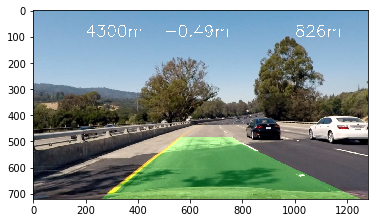

In [34]:
im = mpimg.imread('output_images/test4_undistorted.jpg')
res = orig_img_lane_locate(binary_warped, im, left_fitx, right_fitx, ploty, leftx_base, rightx_base)

curvature: 1819.2609011 m 4949.14967408 m


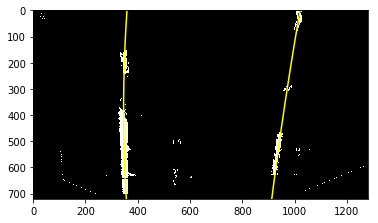

In [35]:
binary_warped = warp_binary_imgs[4]
left_fit, right_fit, ploty, left_fitx, right_fitx, leftx_base, rightx_base = fit_lane_line(binary_warped, True)

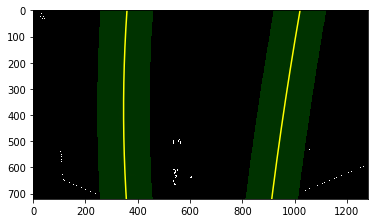

In [36]:
final_visualize(binary_warped, left_fit, right_fit)

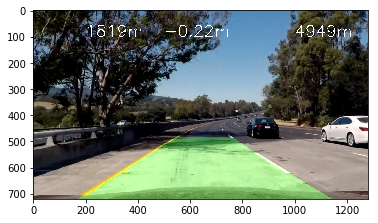

In [37]:
im = mpimg.imread('output_images/test5_undistorted.jpg')
res = orig_img_lane_locate(binary_warped, im, left_fitx, right_fitx, ploty, leftx_base, rightx_base)

curvature: 5562.78722097 m 998.046100616 m


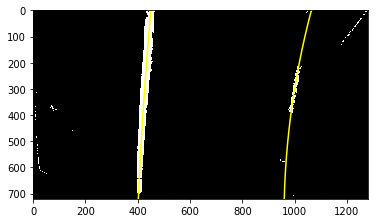

In [38]:
binary_warped = warp_binary_imgs[5]
left_fit, right_fit, ploty, left_fitx, right_fitx, leftx_base, rightx_base = fit_lane_line(binary_warped, True)

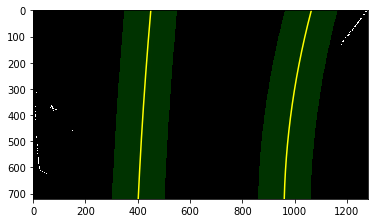

In [39]:
final_visualize(binary_warped, left_fit, right_fit)

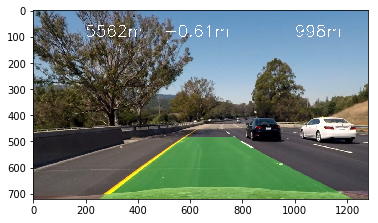

In [40]:
im = mpimg.imread('output_images/test6_undistorted.jpg')
res = orig_img_lane_locate(binary_warped, im, left_fitx, right_fitx, ploty, leftx_base, rightx_base)

In [41]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import cv2

def process_image(img):
    global i
    warp_img = warp(img)
    bin_warp = generate_binary(warp_img, False)
    left_fit, right_fit, ploty, left_fitx, right_fitx, leftx_base, rightx_base = fit_lane_line(bin_warp, False)
    res = orig_img_lane_locate(binary_warped, img, left_fitx, right_fitx, ploty, leftx_base, rightx_base)
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(res, 'FRM=' + str(int(i)), (100,150), font, 2,(255,255,255),2)
    cv2.imwrite('video_out_images' + '/' + str(i) + '.jpg', res)
    i = i + 1
    return res

def process_image2(img):
    global i
    dstRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    i = i + 1
    return dstRGB

i = 0
white_output = 'project_output_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
# clip1 = VideoFileClip("project_video.mp4").subclip(0,5)

#clip1 = VideoFileClip("project_video.mp4")
#white_clip = clip1.fl_image(process_image2)
#%time white_clip.write_videofile(white_output, audio=False)

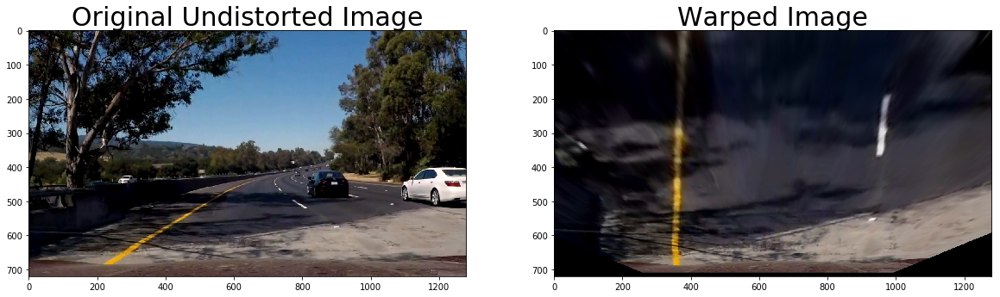

In [42]:
img1 = show_warped('video_images/1038.jpg', True)

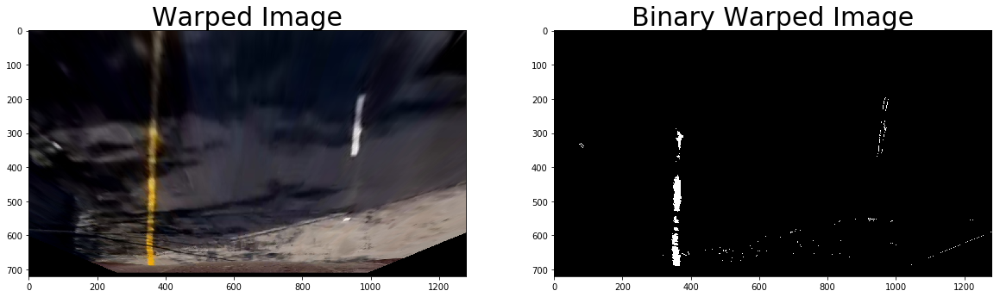

In [43]:
bin_warp = generate_binary(img1, True)

curvature: 1638.92984204 m 413.40616732 m


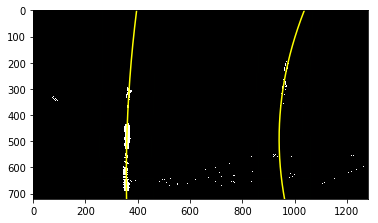

In [44]:
left_fit, right_fit, ploty, left_fitx, right_fitx, leftx_base, rightx_base = fit_lane_line(bin_warp, True)


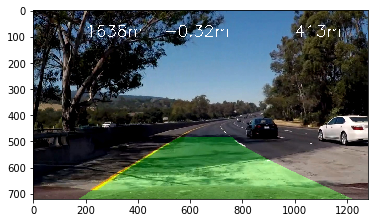

In [45]:
im = mpimg.imread('video_images/1038.jpg')
res = orig_img_lane_locate(bin_warp, im, left_fitx, right_fitx, ploty, leftx_base, rightx_base)

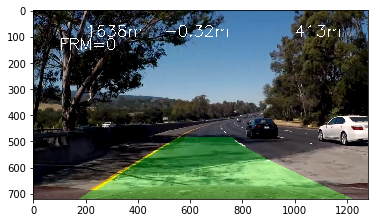

In [46]:
res = process_image(im)
plt.imshow(res)

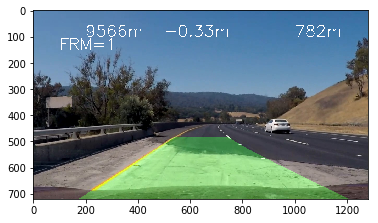

In [47]:
im = mpimg.imread('video_images/613.jpg')
res = process_image(im)
plt.imshow(res)

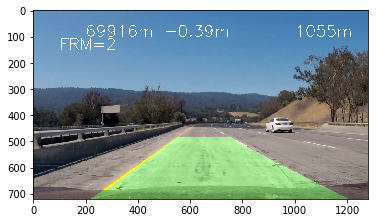

In [48]:
im = mpimg.imread('video_images/578.jpg')
res = process_image(im)
plt.imshow(res)

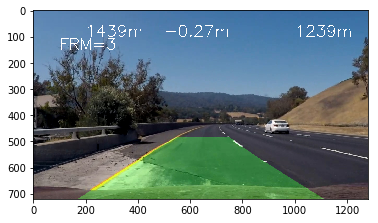

In [49]:
im = mpimg.imread('video_images/618.jpg')
res = process_image(im)
plt.imshow(res)

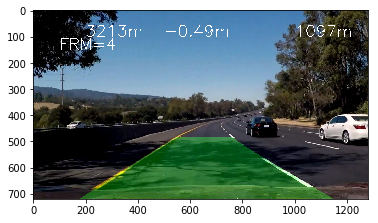

In [50]:
im = mpimg.imread('video_images/1045.jpg')
res = process_image(im)
plt.imshow(res)

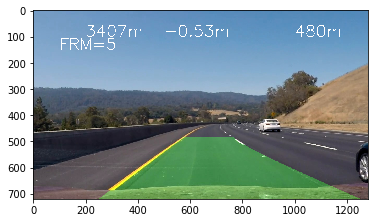

In [51]:
im = mpimg.imread('video_images/679.jpg')
#bin_im = white_thresh(im)
res = process_image(im)
#plt.imshow(bin_im, cmap='gray')
plt.imshow(res)

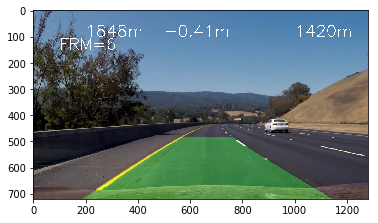

In [52]:
im = mpimg.imread('video_images/630.jpg')
#bin_im = white_thresh(im)
res = process_image(im)
#plt.imshow(bin_im, cmap='gray')
plt.imshow(res)

[MoviePy] >>>> Building video project_output_video.mp4
[MoviePy] Writing video project_output_video.mp4


100%|█████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [08:28<00:00,  2.44it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_output_video.mp4 

Wall time: 8min 31s


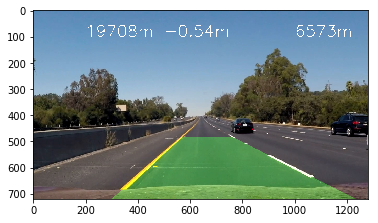

In [54]:
i = 0
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image)
%time white_clip.write_videofile(white_output, audio=False)